In [1]:
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from scipy.stats.stats import pearsonr
from mplsoccer.pitch import Pitch
import os
import random
import math
from ipynb.fs.defs.PassesData import get_df_passes
from ipynb.fs.defs.ExpectedGoalsData import get_df_shots
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.mode.chained_assignment = None

In [2]:
plt.style.use('fivethirtyeight')
params = {'axes.titlesize': 'x-large',
          'axes.labelsize': 'large', 
          'xtick.labelsize':'large',
          'ytick.labelsize':'large'}
plt.rcParams.update(params)

In [3]:
match_id = 22912

In [4]:
lineups_path = "data/lineups/{0}.json"
events_path = "data/events/{0}.json"

In [5]:
matches = pd.read_excel('extracted_data/matches.xlsx')
players = pd.read_excel('extracted_data/players.xlsx')

In [6]:
match = matches[matches['match_id'] == match_id]
team1_id = match['home_team_id'].iloc[0]
team2_id = match['away_team_id'].iloc[0]
team1_name = match['home_team_name'].iloc[0]
team2_name = match['away_team_name'].iloc[0]
home_score = match['home_score'].iloc[0]
away_score = match['away_score'].iloc[0]

In [7]:
# read lineups
with open(lineups_path.format(match_id), encoding='utf8') as f:
    lineups = json.load(f)
    names_dict = {player["player_name"]: player["player_nickname"] for team in lineups for player in team["lineup"]}

# read events
with open(events_path.format(match_id), encoding='utf8') as f:
    events = json.load(f)
    events = pd.DataFrame(events).assign(match_id=match_id)

In [8]:
passes = get_df_passes(events)

In [9]:
shots = get_df_shots(events)

In [10]:
# calculate xG
import joblib
import pickle
xg_model = joblib.load('models/expected_goals_model.pkl')
with open("models/xg_selected_features.txt", "rb") as fp:
     xg_selected_features = pickle.load(fp)
shots.loc[:, 'pred_xg'] = xg_model.predict_proba(shots[xg_selected_features])[:, 1]

In [11]:
events.loc[:, 'location_x'] = [events['location'].iloc[i][0] if isinstance(events['location'].iloc[i], list) else -1 for i in range(len(events))]
events.loc[:, 'location_y'] = [events['location'].iloc[i][1] if isinstance(events['location'].iloc[i], list) else -1 for i in range(len(events))]
events.loc[:, 'type_name'] = [events['type'].iloc[i]['name'] for i in range(len(events))]
events.loc[:, 'player_id'] = [events['player'].iloc[i]['id'] if isinstance(events['player'].iloc[i], dict) else -1 for i in range(len(events))]
events.loc[:, 'team_id'] = [events['team'].iloc[i]['id'] if isinstance(events['team'].iloc[i], dict) else -1 for i in range(len(events))]
events.loc[:, 'regular_play'] = [1 if events['play_pattern'].iloc[i]['id'] == 1 else 0 for i in range(len(events))]
events['player_id'] = events['player_id'].astype(int)

In [12]:
def get_player_name(player_id):
    if pd.notna(players.loc[players['player_id'] == player_id, 'player_nickname'].iloc[0]):
        return players.loc[players['player_id'] == player_id, 'player_nickname'].iloc[0]
    else:
        return players.loc[players['player_id'] == player_id, 'player_name'].iloc[0]

In [13]:
def draw_pass_map(player_id):
    player_passes = passes[passes['player_id'] == player_id]
    pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, label=True, tick=True,
                  orientation='vertical', tight_layout=False)
    fig, ax = pitch.draw()
    pass_accuracy = np.round(100 * len(player_passes[player_passes['complete'] == 1]) / len(player_passes), 2)
    if pass_accuracy == 100:
        ax.scatter(player_passes['location_y'], player_passes['location_x'], c='black')
    else:
        ax.scatter(player_passes['location_y'], player_passes['location_x'], c=player_passes['complete'], cmap='binary')
    plt.text(3, -2.5, str(len(player_passes)) + ' Pässe' + '   ' + str(pass_accuracy) + '% Passgenauigkeit', color='black')
    plt.title('(Angekommene) Pässe von ' + get_player_name(player_id))
    plt.show()

In [14]:
#for player_id in passes['player_id'].unique():
#    draw_pass_map(player_id)

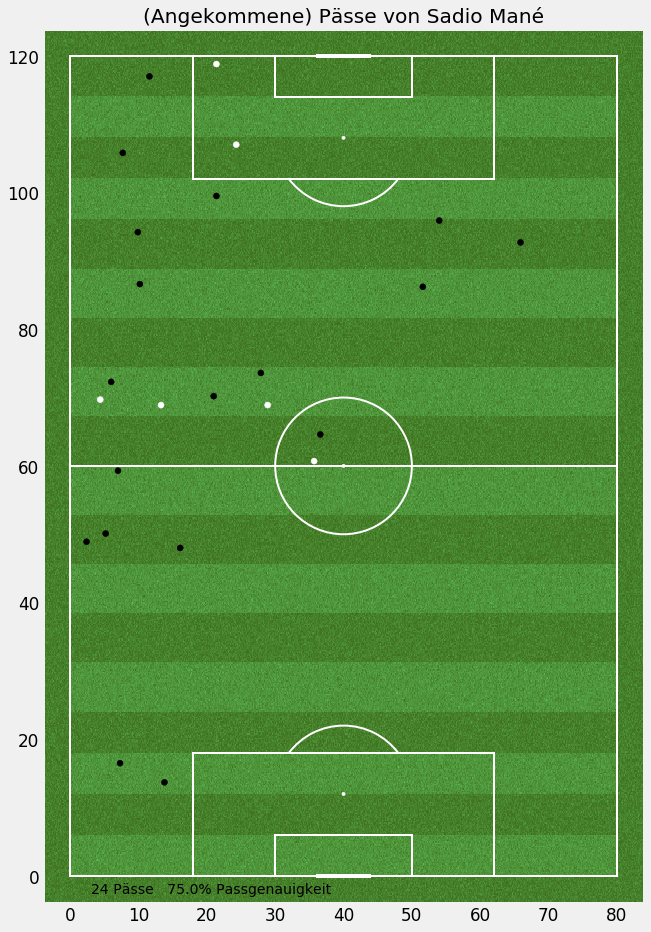

In [15]:
draw_pass_map(3629)

In [16]:
def draw_pass_arrows(player_id):
    pitch = Pitch(figsize=(15,18), pitch_color='grass', line_color='white', stripe=True, axis=True, label=True, tick=True,
                  orientation='horizontal', tight_layout=False)
    fig, ax = pitch.draw()
    player_passes = passes[passes['player_id'] == player_id]
    for idx, thepass in player_passes.iterrows():
        x = thepass['location_x']
        y = thepass['location_y']
        passCircle = plt.Circle((x, y), 2, color="blue")      
        passCircle.set_alpha(.2)   
        ax.add_patch(passCircle)
        dx = thepass['end_location_x']-x
        dy = thepass['end_location_y']-y
        arrow_color = 'blue' if thepass['complete'] == 1 else 'red'
        passArrow = plt.Arrow(x, y, dx, dy, width=3, color=arrow_color)
        ax.add_patch(passArrow)

    player = players[players['player_id'] == player_id].iloc[0]
    pass_accuracy = np.round(100 * len(player_passes[player_passes['complete'] == 1]) / len(player_passes), 2)
    plt.text(4, 83, str(len(player_passes)) + ' Pässe' + '   ' + str(pass_accuracy) + '% Passgenauigkeit', color='black')
    plt.text(4, -1.5, 'Blau: Angekommene Pässe   Rot: Fehlpässe', color='black')
    plt.title('Pässe von ' + get_player_name(player_id))
    plt.show()

In [17]:
#for player_id in passes['player_id'].unique():
#    draw_pass_arrows(player_id)

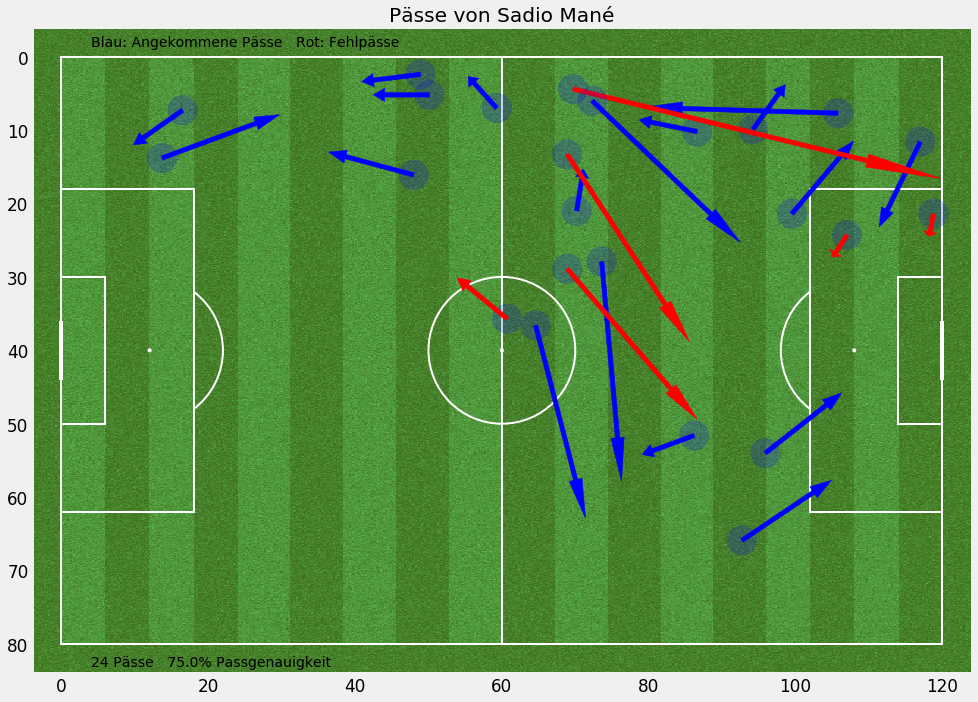

In [18]:
draw_pass_arrows(3629)

In [19]:
df_possessions = pd.DataFrame()
for idx in range(1, len(events)):
    if events['possession'].iloc[idx] > events['possession'].iloc[idx-1]:
        df_possessions = df_possessions.append(events.iloc[idx], ignore_index=True)

In [20]:
df_possessions.loc[:, 'location_x'] = [df_possessions['location'].iloc[i][0] for i in range(len(df_possessions))]
df_possessions.loc[:, 'location_y'] = [df_possessions['location_y'].iloc[i] if df_possessions['location_y'].iloc[i] > 1 else 0 for i in range(len(df_possessions))]
df_possessions.loc[:, 'type_name'] = [df_possessions['type'].iloc[i]['name'] for i in range(len(df_possessions))]
df_possessions.loc[:, 'player_id'] = [df_possessions['player'].iloc[i]['id'] if isinstance(df_possessions['player'].iloc[i], dict) else -1 for i in range(len(df_possessions))]
df_possessions.loc[:, 'team_id'] = [df_possessions['team'].iloc[i]['id'] if isinstance(df_possessions['team'].iloc[i], dict) else -1 for i in range(len(df_possessions))]
df_possessions['player_id'] = df_possessions['player_id'].astype(int)

In [22]:
def draw_possession_wins(team_id, team_name):
    team_possessions = df_possessions[df_possessions['team_id'] == team_id]
    pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, label=True, tick=True,
                  orientation='vertical', tight_layout=False)
    fig, ax = pitch.draw()
    ax.scatter(team_possessions['location_y'], team_possessions['location_x'], c='black')
    plt.title('Position der Ballgewinne von ' + team_name)
    plt.show()

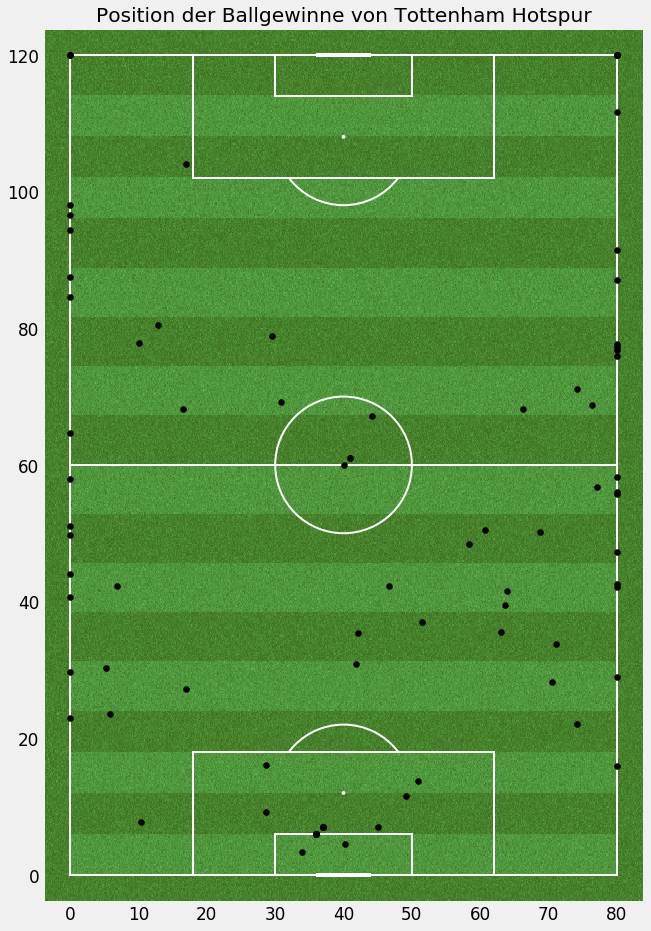

In [23]:
draw_possession_wins(team1_id, team1_name)

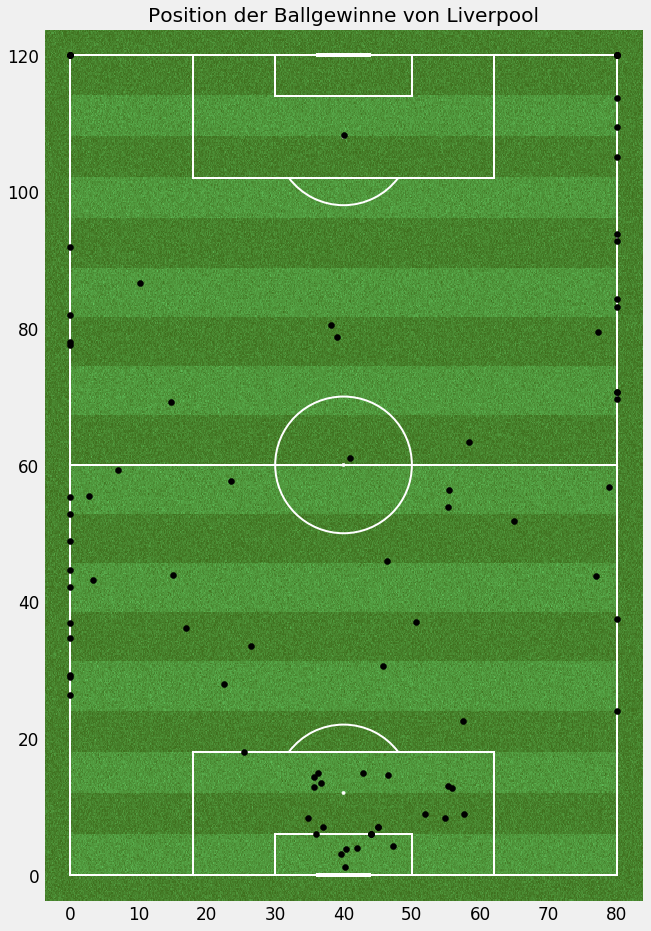

In [24]:
draw_possession_wins(team2_id, team2_name)

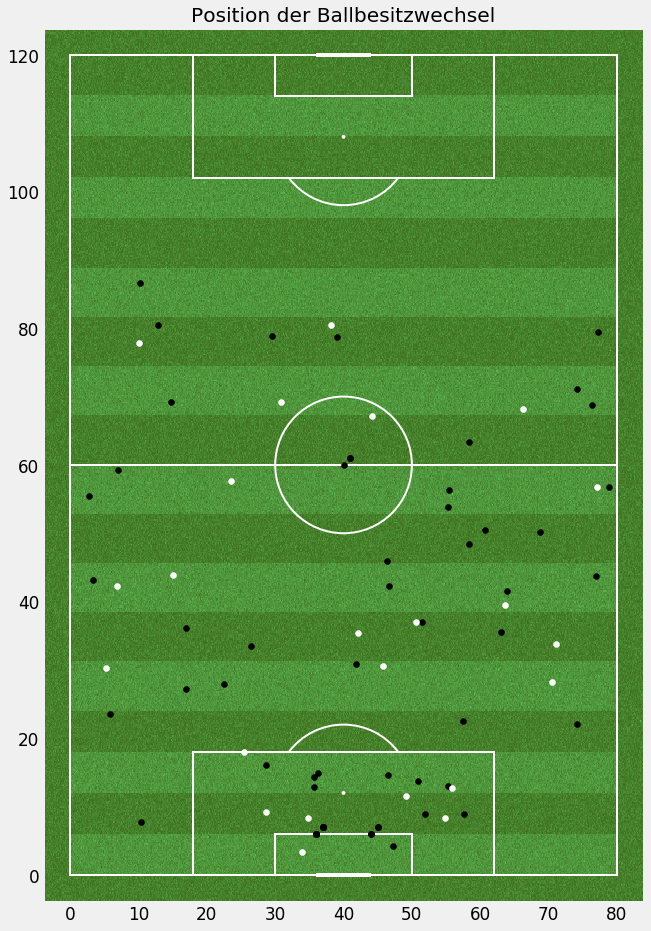

In [25]:
pass_possessions = df_possessions[(df_possessions['type_name'] == 'Pass') & (df_possessions['location_y'] > 0) & (df_possessions['location_y'] < 80)]
recovery_possessions = df_possessions[(df_possessions['type_name'] == 'Ball Recovery') | (df_possessions['type_name'] == 'Duel')]
pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, label=True, tick=True,
              orientation='vertical', tight_layout=False)
fig, ax = pitch.draw()
ax.scatter(pass_possessions['location_y'], pass_possessions['location_x'], c='black')
ax.scatter(recovery_possessions['location_y'], recovery_possessions['location_x'], c='white')
plt.title('Position der Ballbesitzwechsel')
plt.show()

In [26]:
defensive_actions = ['Pressure', 'Ball Recovery', 'Duel', 'Interception', '50/50', 'Clearance', 'Block', 
                     'Dribbled Past', 'Foul Committed', 'Own Goal Against', 'Goal Keeper', 'Shield']
offensive_actions = ['Pass', 'Ball Receipt', 'Carry', 'Dribble', 'Dispossessed', 'Foul Won', 'Miscontrol', 
                     'Offside', 'Shot', 'Error']
events.loc[:, 'type_name'] = [events['type'].iloc[i]['name'] for i in range(len(events))]
events['type_name'] = events['type_name'].str.replace('*', '')
events.loc[:, 'offensive_action'] = [1 if events['type_name'].iloc[i] in offensive_actions else 0 for i in range(len(events))]
events.loc[:, 'defensive_action'] = [1 if events['type_name'].iloc[i] in defensive_actions else 0 for i in range(len(events))]

In [27]:
def draw_player_events(player_id, only_regular_play=False):
    player_events = events[events['player_id'] == player_id]
    player_events = player_events[(player_events['location_x'] >= 0) & (player_events['location_y'] >= 0)]
    if only_regular_play:
        player_events = player_events[player_events['regular_play'] == 1]
    pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, tick=True,
                  orientation='vertical', tight_layout=False)
    fig, ax = pitch.draw()
    player_offensive = player_events[player_events['offensive_action'] == 1]
    ax.scatter(player_offensive['location_y'], player_offensive['location_x'], c='black', label='Offensivaktionen')
    player_defensive = player_events[player_events['defensive_action'] == 1]
    ax.scatter(player_defensive['location_y'], player_defensive['location_x'], c='white', label='Defensivaktionen')
    plt.title('Aktionen von ' + get_player_name(player_id))
    plt.legend(loc=(0.65,0.91))
    plt.show()

In [28]:
#for player_id in events['player_id'].unique():
#    if player_id > -1:
#        draw_player_events(player_id)

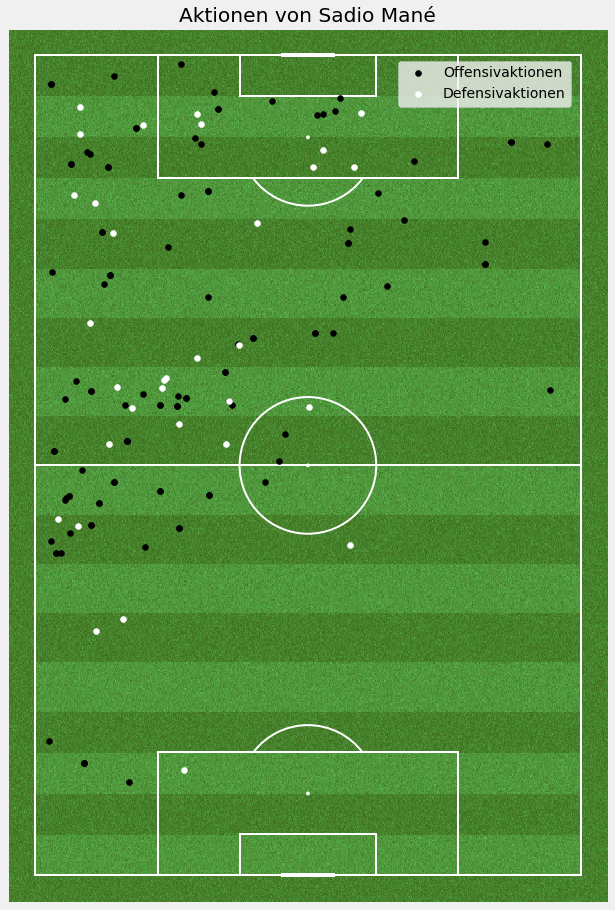

In [29]:
draw_player_events(3629)

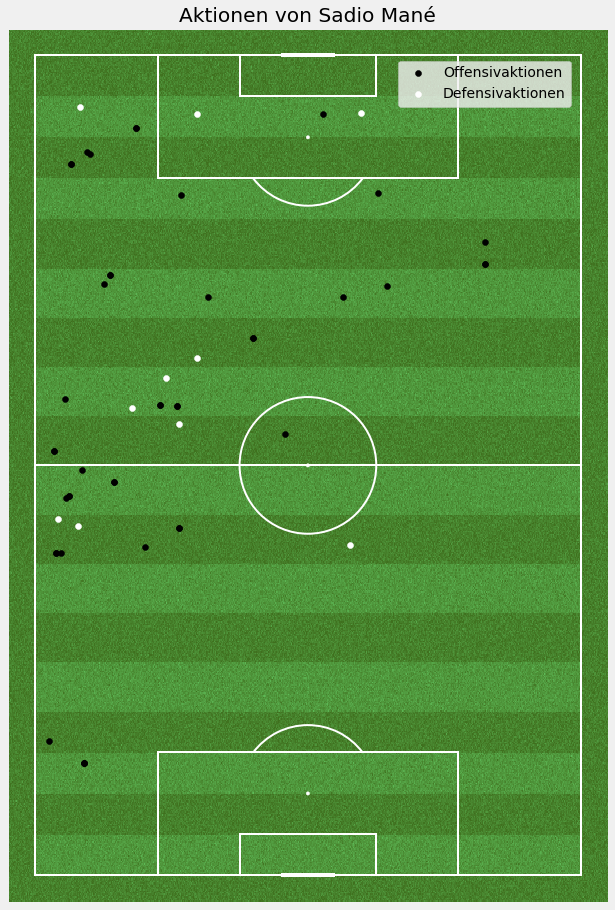

In [30]:
draw_player_events(3629, only_regular_play=True)

In [31]:
def draw_heatmap(player_id, offensive_actions=None, only_regular_play=False):
    if offensive_actions == None:
        player_events = events[events['player_id'] == player_id]
        title_add = ''
    elif offensive_actions:
        player_events = events[(events['player_id'] == player_id) & (events['offensive_action'] == 1)]
        title_add = '\nin der Offensive'
    else:
        player_events = events[(events['player_id'] == player_id) & (events['defensive_action'] == 1)]
        title_add = '\nin der Defensive'
    if only_regular_play:
        player_events = player_events[player_events['regular_play'] == 1]
    player_events.reset_index(inplace=True, drop=True)
    player_events = player_events[(player_events['location_x'] >= 0) & (player_events['location_y'] >= 0)]
    pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, tick=True,
                  orientation='vertical', tight_layout=False)
    fig, ax = pitch.draw()
    sns.kdeplot(x=player_events['location_y'], y=player_events['location_x'], shade=True, thresh=0.3, n_levels=5, cmap='Reds', clip=[(0,80), (0,120)], ax=ax)
    plt.title('Heatmap der Aktionen von ' + get_player_name(player_id) + title_add)
    plt.show()

In [32]:
#for player_id in events['player_id'].unique():
#    if player_id > -1:
#        draw_heatmap(player_id)

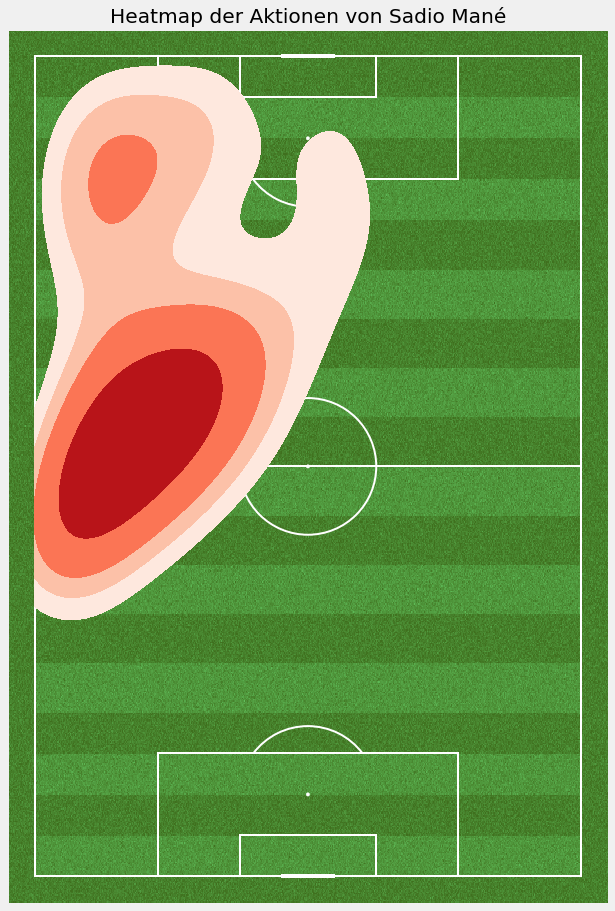

In [33]:
draw_heatmap(3629, only_regular_play=False)

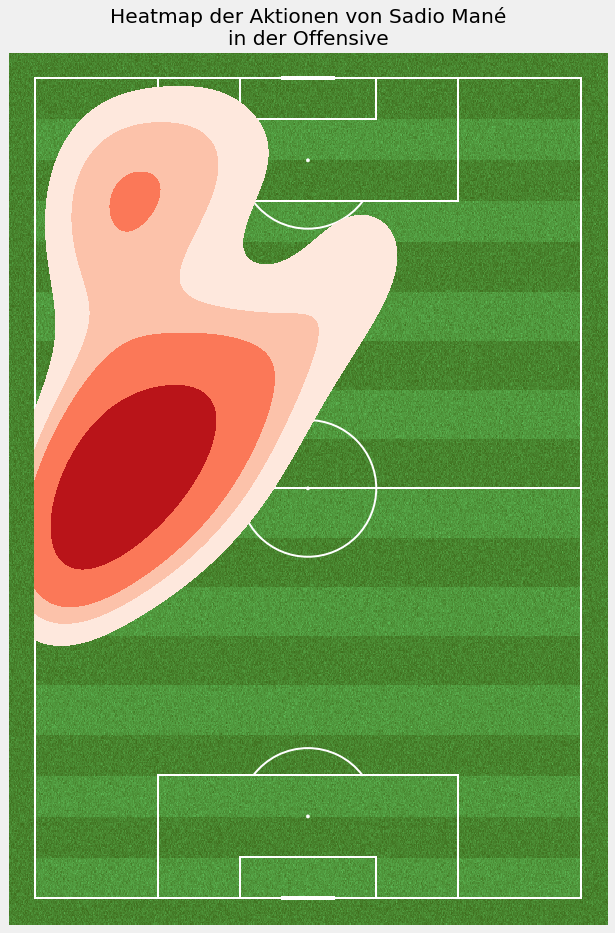

In [34]:
draw_heatmap(3629, offensive_actions=True, only_regular_play=False)

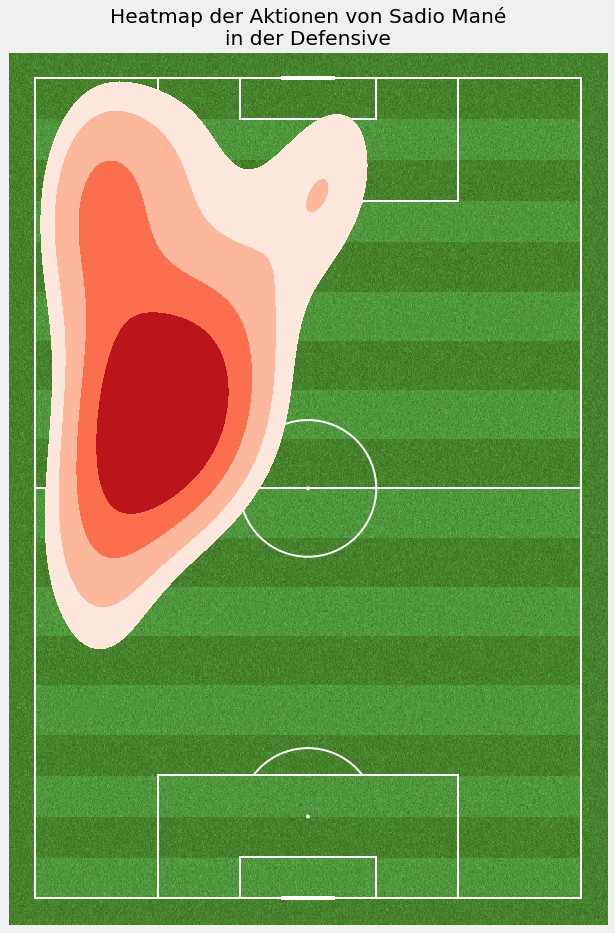

In [35]:
draw_heatmap(3629, offensive_actions=False, only_regular_play=False)

In [36]:
def draw_avg_positions(team_id, team_name, offensive_position=None, only_regular_play=False):
    pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, tick=True,
                  orientation='vertical', tight_layout=False)
    fig, ax = pitch.draw()
    if offensive_position == None:
        team_events = events[events['team_id'] == team_id]
        title_add = ''
    elif offensive_position:
        team_events = events[(events['team_id'] == team_id) & ((events['offensive_action'] == 1) | (~events['substitution'].isna()))]
        title_add = '\nin der Offensive'
    else:
        team_events = events[(events['team_id'] == team_id) & ((events['defensive_action'] == 1) | (~events['substitution'].isna()))]
        title_add = '\nin der Defensive'
    if only_regular_play:
        team_events = team_events[(team_events['regular_play'] == 1) | (~events['substitution'].isna())]
    team_events.reset_index(inplace=True, drop=True)
    first_sub = team_events[~team_events['substitution'].isna()]
    if len(first_sub) > 0:
        team_events = team_events[:first_sub.index[0]]
    for player_id in team_events['player_id'].unique():
        if player_id > -1:
            player_events = team_events[team_events['player_id'] == player_id]
            player_events = player_events[(player_events['location_x'] >= 0) & (player_events['location_y'] >= 0)]
            loc_x, loc_y = np.mean(player_events[['location_x', 'location_y']])
            plt.scatter(loc_y, loc_x, color='black', s=100)
            player_name = get_player_name(player_id)
            if player_name.find(' ') > -1:
                player_name = ' '.join(player_name.split()[1:])
            plt.text(loc_y-(len(player_name)/2), loc_x+2, player_name, color='black')
    plt.title('Durchschnittliche Spielfeldpositionen von ' + team_name + title_add)
    plt.show()

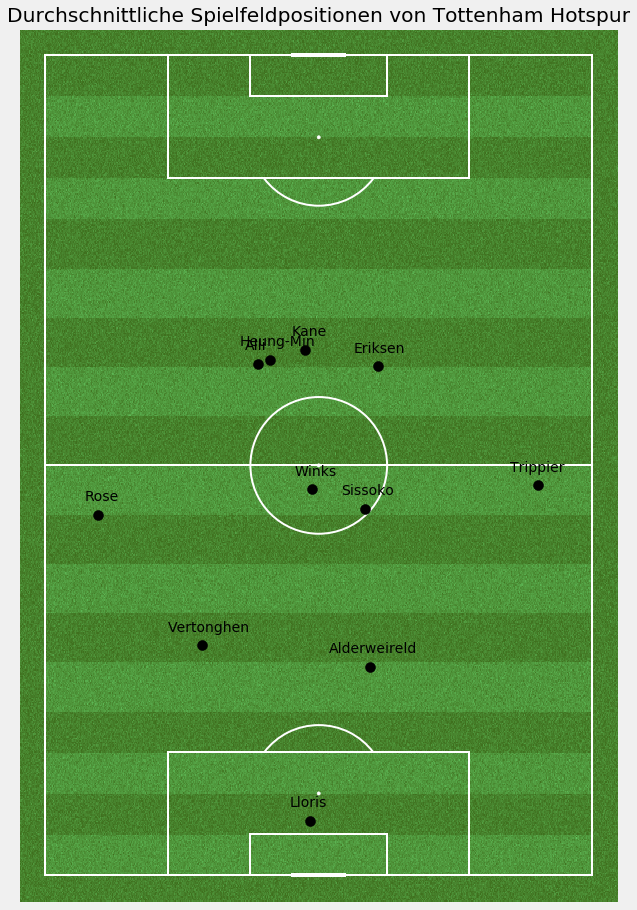

In [37]:
draw_avg_positions(team1_id, team1_name)

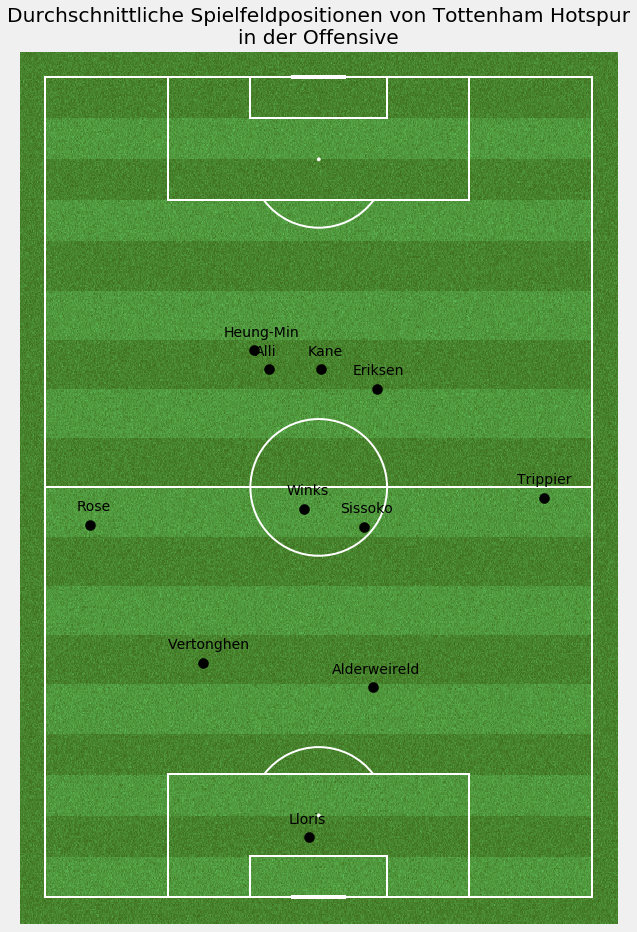

In [38]:
draw_avg_positions(team1_id, team1_name, offensive_position=True)

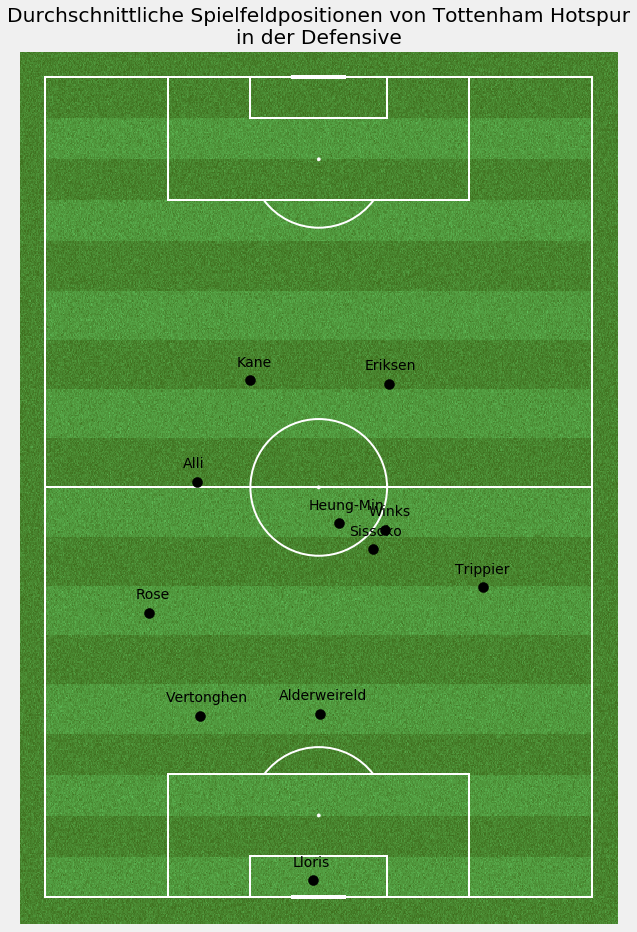

In [39]:
draw_avg_positions(team1_id, team1_name, offensive_position=False)

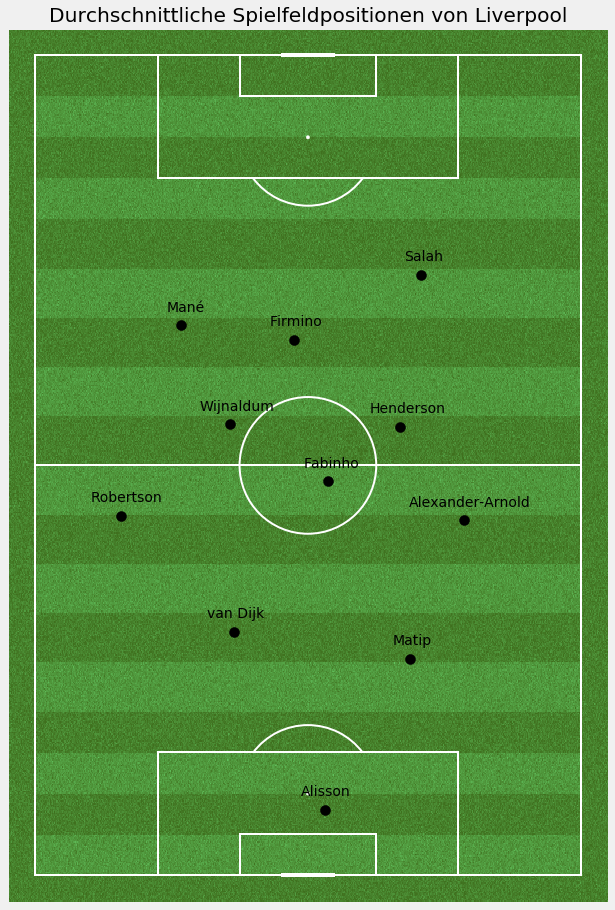

In [40]:
draw_avg_positions(team2_id, team2_name)

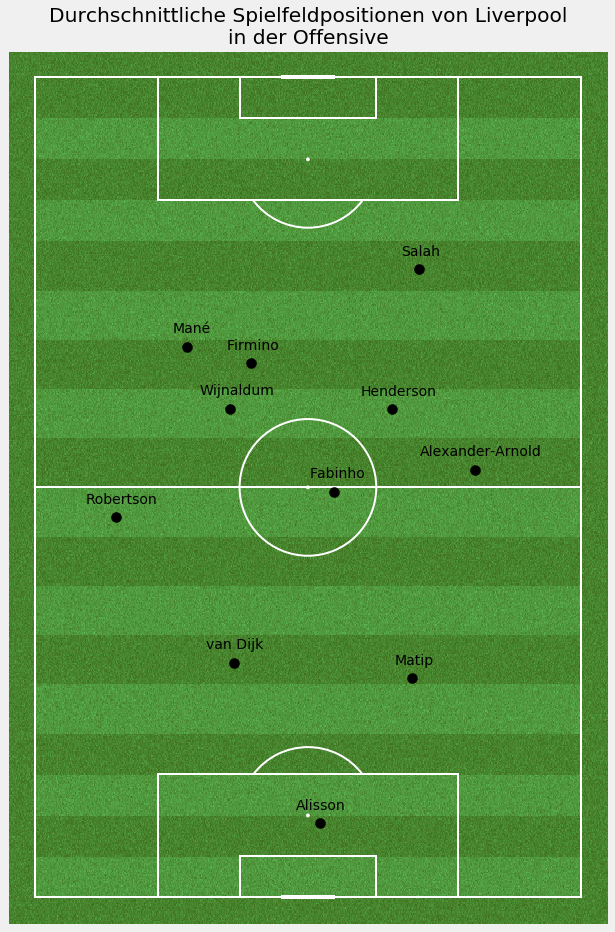

In [41]:
draw_avg_positions(team2_id, team2_name, offensive_position=True)

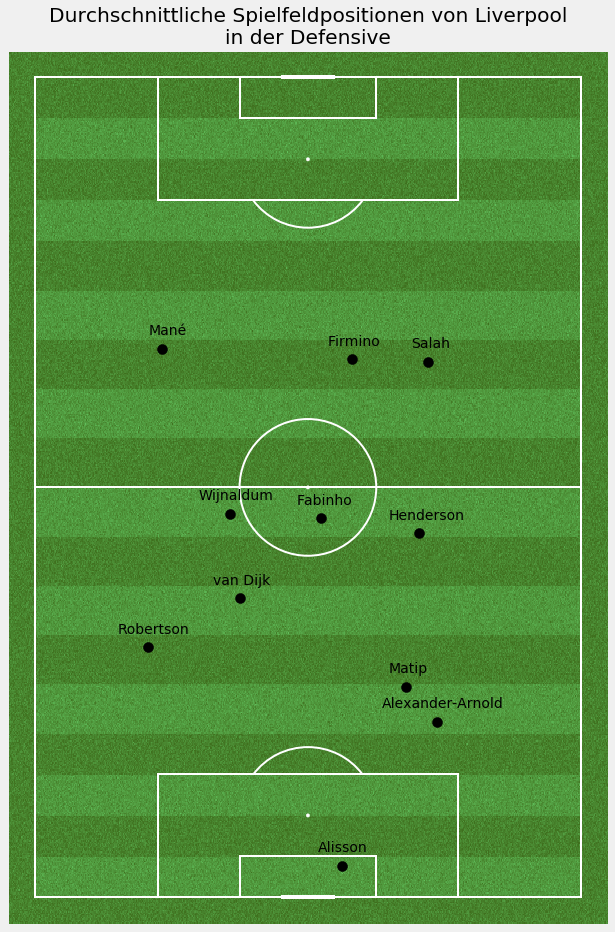

In [42]:
draw_avg_positions(team2_id, team2_name, offensive_position=False)

In [43]:
def draw_avg_zones(team_id, team_name, offensive_position=None):
    pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, tick=True,
                  orientation='vertical', tight_layout=False)
    fig, ax = pitch.draw()
    if offensive_position == None:
        team_events = events[events['team_id'] == team_id]
    elif offensive_position:
        team_events = events[(events['team_id'] == team_id) & ((events['offensive_action'] == 1) | (~events['substitution'].isna()))]
        team_name += '\nin der Offensive'
    else:
        team_events = events[(events['team_id'] == team_id) & ((events['defensive_action'] == 1) | (~events['substitution'].isna()))]
        team_name += '\nin der Defensive'
    team_events.reset_index(inplace=True, drop=True)
    first_sub = team_events[~team_events['substitution'].isna()]
    if len(first_sub) > 0:
        team_events = team_events[:first_sub.index[0]]
    patches = []
    for player_id in team_events['player_id'].unique():
        if player_id > -1:
            player_events = team_events[team_events['player_id'] == player_id]
            player_events = player_events[(player_events['location_x'] >= 0) & (player_events['location_y'] >= 0)]
            if len(player_events) >= 4:
                mean_x, mean_y = np.mean(player_events[['location_x', 'location_y']])
                df_dist = player_events[['location_x', 'location_y']]
                df_dist.loc[:, 'distance'] = [np.sqrt((mean_x - df_dist['location_x'].iloc[i])**2 + (mean_y - df_dist['location_y'].iloc[i])**2) for i in range(len(df_dist))]
                df_dist = df_dist.sort_values('distance', ascending=True)[:int(len(player_events)/4)]
                df_dist = df_dist.append(pd.Series({'location_x': mean_x, 'location_y': mean_y, 'distance': 0}), ignore_index=True)
                locs = []
                for _, row in df_dist[['location_y', 'location_x']].iterrows():
                    locs.append((row['location_y'], row['location_x']))
                cent=(sum([loc[0] for loc in locs])/len(locs),sum([loc[1] for loc in locs])/len(locs))
                locs.sort(key=lambda loc: math.atan2(loc[1]-cent[1],loc[0]-cent[0]))
                polygon = Polygon(locs, closed=True)
                patches.append(polygon)
                plt.scatter(mean_y, mean_x, color='black', s=100, zorder=2)
                player_name = get_player_name(player_id)
                if player_name.find(' ') > -1:
                    player_name = ' '.join(player_name.split(' ')[1:])
                plt.text(mean_y-(len(player_name)/2), mean_x+2, player_name, fontsize=13, color='white', zorder=3)
    p = PatchCollection(patches, cmap=plt.cm.jet, alpha=0.5)
    colors = 100*np.random.random(len(patches))
    p.set_array(np.array(colors))
    ax.add_collection(p)
    plt.title('Durchschnittliche Spielfeldzonen von ' + team_name)
    plt.show()

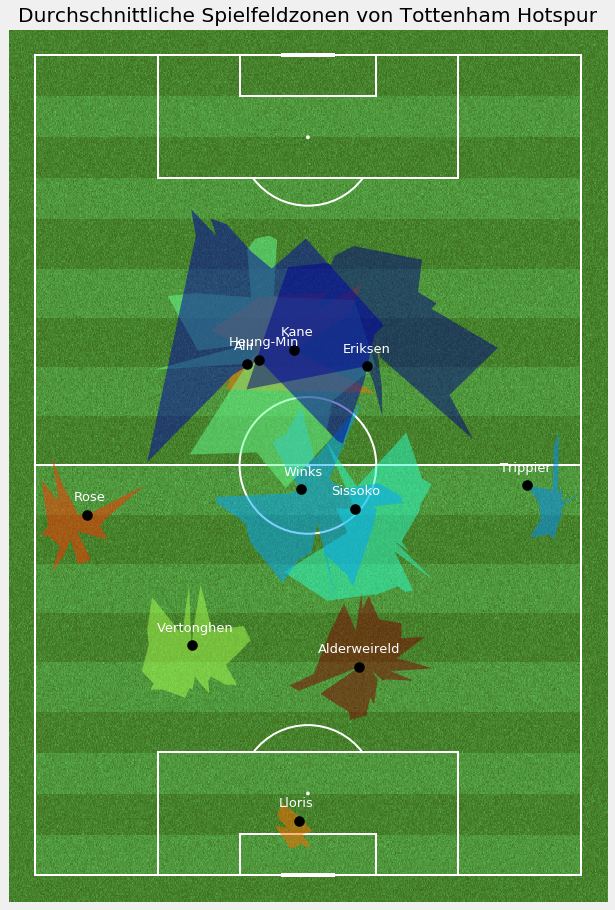

In [44]:
draw_avg_zones(team1_id, team1_name)

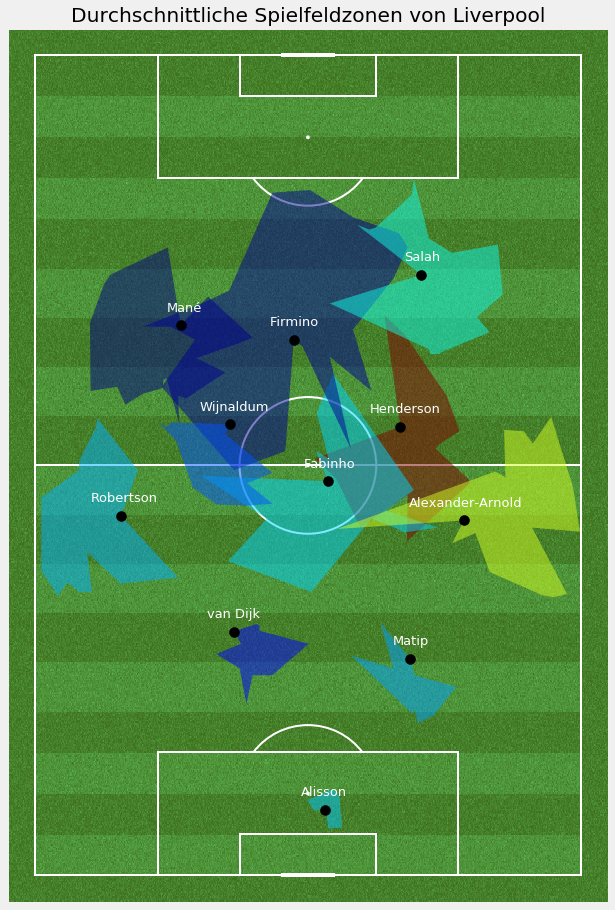

In [45]:
draw_avg_zones(team2_id, team2_name)

In [46]:
def draw_avg_zones(team_id, team_name, offensive_position=None):
    pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, tick=True,
                  orientation='vertical', tight_layout=False)
    fig, ax = pitch.draw()
    if offensive_position == None:
        team_events = events[events['team_id'] == team_id]
    elif offensive_position:
        team_events = events[(events['team_id'] == team_id) & ((events['offensive_action'] == 1) | (~events['substitution'].isna()))]
        team_name += '\nin der Offensive'
    else:
        team_events = events[(events['team_id'] == team_id) & ((events['defensive_action'] == 1) | (~events['substitution'].isna()))]
        team_name += '\nin der Defensive'
    team_events.reset_index(inplace=True, drop=True)
    first_sub = team_events[~team_events['substitution'].isna()]
    if len(first_sub) > 0:
        team_events = team_events[:first_sub.index[0]]
    cmaps = ['Reds', 'Blues', 'Greens', 'Oranges', 'Purples', 'Greys', 'coolwarm', 
             'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn']
    for player_id in team_events['player_id'].unique():
        if player_id > -1:
            player_events = team_events[team_events['player_id'] == player_id]
            player_events = player_events[(player_events['location_x'] >= 0) & (player_events['location_y'] >= 0)]
            if len(player_events) >= 4:
                mean_x, mean_y = np.mean(player_events[['location_x', 'location_y']])
                df_dist = player_events[['location_x', 'location_y']]
                df_dist.loc[:, 'distance'] = [np.sqrt((mean_x - df_dist['location_x'].iloc[i])**2 + (mean_y - df_dist['location_y'].iloc[i])**2) for i in range(len(df_dist))]
                df_dist = df_dist.sort_values('distance', ascending=True)[:int(len(player_events)/4)]
                df_dist = df_dist.append(pd.Series({'location_x': mean_x, 'location_y': mean_y, 'distance': 0}), ignore_index=True)
                sns.kdeplot(x=df_dist['location_y'], y=df_dist['location_x'], shade=True, thresh=0.7, n_levels=4, cmap=random.choice(cmaps), clip=[(0,80), (0,120)], ax=ax)
                plt.scatter(mean_y, mean_x, color='black', s=100)
                player_name = get_player_name(player_id)
                if player_name.find(' ') > -1:
                    player_name = ' '.join(player_name.split(' ')[1:])
                plt.text(mean_y-(len(player_name)/2), mean_x+2, player_name, fontsize=13, color='black')
    plt.title('Durchschnittliche Spielfeldzonen von ' + team_name)
    plt.show()

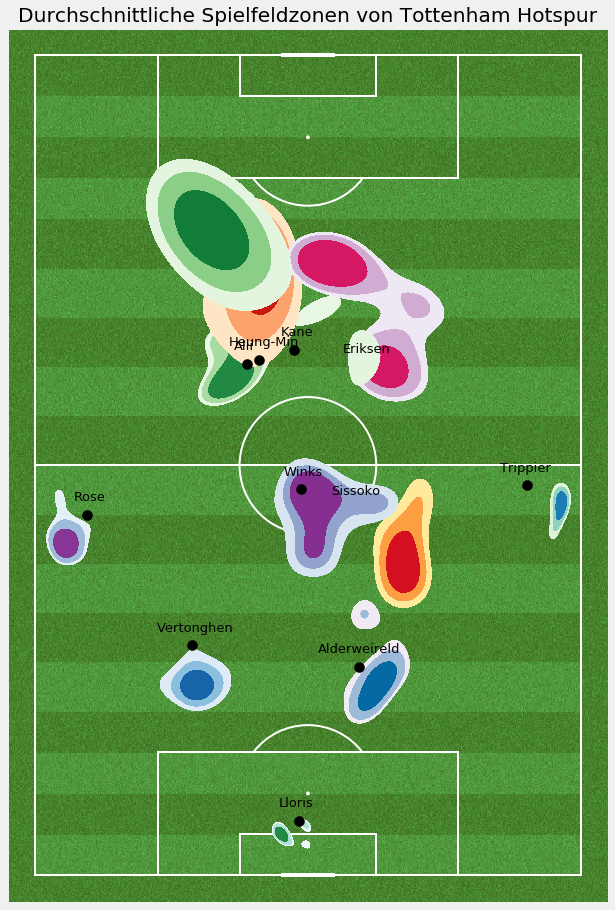

In [47]:
draw_avg_zones(team1_id, team1_name)

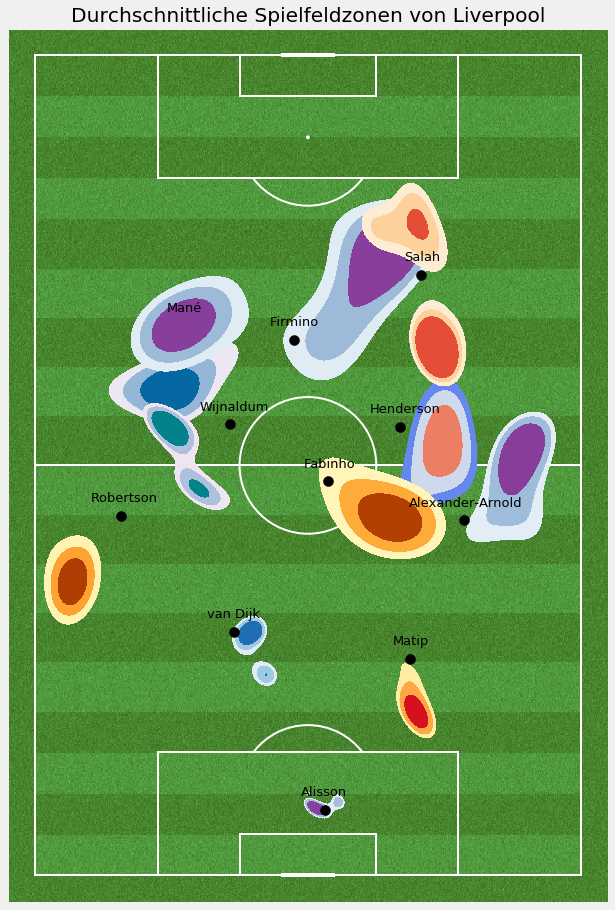

In [48]:
draw_avg_zones(team2_id, team2_name)

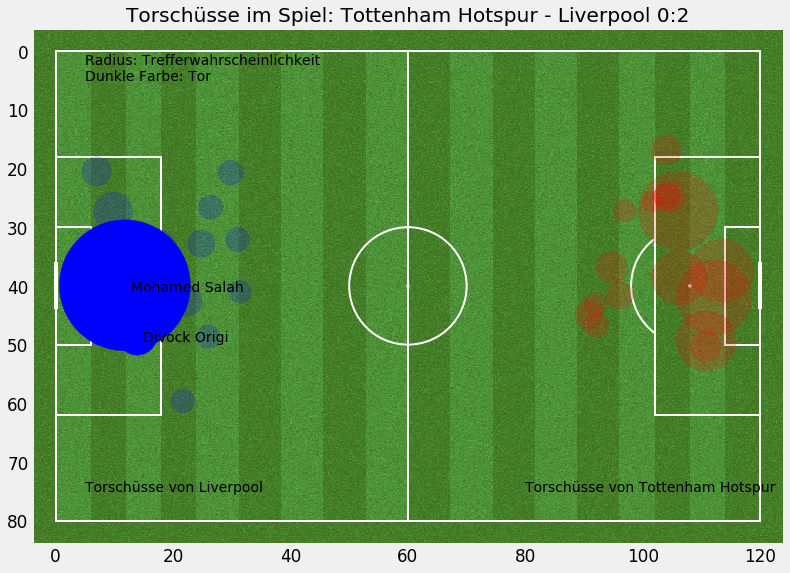

In [49]:
# Torschüsse
pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, label=True, tick=True,
              orientation='horizontal', tight_layout=False)
fig, ax = pitch.draw()

#Plot the shots
for idx, shot in shots.iterrows():
    x = shot['location_x']
    y = shot['location_y']
    goal = shot['goal'] == 1
    team_id = shot['team_id']
    #circleSize = 2
    circleSize = np.sqrt(shot['pred_xg'])*12
    player_name = players.loc[players['player_id'] == shot['player_id'], 'player_nickname'].iloc[0]
    if not isinstance(player_name, str):
        player_name = players.loc[players['player_id'] == shot['player_id'], 'player_name'].iloc[0]
    if (team_id == team1_id):
        if goal:
            shotCircle = plt.Circle((x,y), circleSize, color="red")
            plt.text((x+1), y+1, player_name) 
        else:
            shotCircle = plt.Circle((x,y), circleSize, color="red")     
            shotCircle.set_alpha(.2)
    elif (team_id == team2_id):
        if goal:
            shotCircle = plt.Circle((120-x,80-y), circleSize, color="blue") 
            plt.text((120-x+1), 80-y+1, player_name) 
        else:
            shotCircle = plt.Circle((120-x,80-y), circleSize, color="blue")      
            shotCircle.set_alpha(.2)
    ax.add_patch(shotCircle)
    
plt.text(5, 75, 'Torschüsse von ' + team2_name)
plt.text(80, 75, 'Torschüsse von ' + team1_name)
plt.text(5, 5, 'Radius: Trefferwahrscheinlichkeit\nDunkle Farbe: Tor')
plt.title('Torschüsse im Spiel: ' + team1_name + ' - ' + team2_name + ' ' + str(home_score) + ':' + str(away_score))
plt.show()

In [50]:
def get_pass_zone(thepass, from_location=True):
    if from_location:
        zone_x = np.ceil(thepass['location_x'] / 120 * 6)
        zone_y = np.ceil(thepass['location_y'] / 80 * 4)
    else:
        zone_x = np.ceil(thepass['end_location_x'] / 120 * 6)
        zone_y = np.ceil(thepass['end_location_y'] / 80 * 4)
    zone = ((zone_x-1) * 4) + zone_y
    return int(zone)

In [51]:
passes.loc[:, 'from_zone'] = passes.apply(lambda row: get_pass_zone(row, from_location=True), axis=1)
passes.loc[:, 'to_zone'] = passes.apply(lambda row: get_pass_zone(row, from_location=False), axis=1)

In [52]:
def draw_passes_in_zones(team_id, team_name):
    passes_zones = passes.loc[(passes['team_id'] == team_id) & (passes['to_zone'] <= 24), ['from_zone', 'to_zone']].groupby(['from_zone', 'to_zone']).size().reset_index(name='counts')
    pitch = Pitch(figsize=(12,15), pitch_color='grass', line_color='white', stripe=True, axis=True, label=True, tick=True,
                      orientation='vertical', tight_layout=False)
    fig, ax = pitch.draw()
    centroids = pd.DataFrame([(y*20+10, x*20+10) for x in range(6) for y in range(4)], columns=['loc_y', 'loc_x'])
    centroids.index = np.arange(1, len(centroids)+1)
    ax.scatter(centroids['loc_y'], centroids['loc_x'], color='black')
    for _, row in passes_zones.iterrows():
        from_centroid = centroids.loc[int(row['from_zone'])]
        to_centroid = centroids.loc[int(row['to_zone'])]
        ax.plot([from_centroid['loc_y'], to_centroid['loc_y']], [from_centroid['loc_x'], to_centroid['loc_x']], linewidth=row['counts'], color='black')
    plt.title('Pässe in den Spielfeldzonen von ' + team_name)
    plt.show()

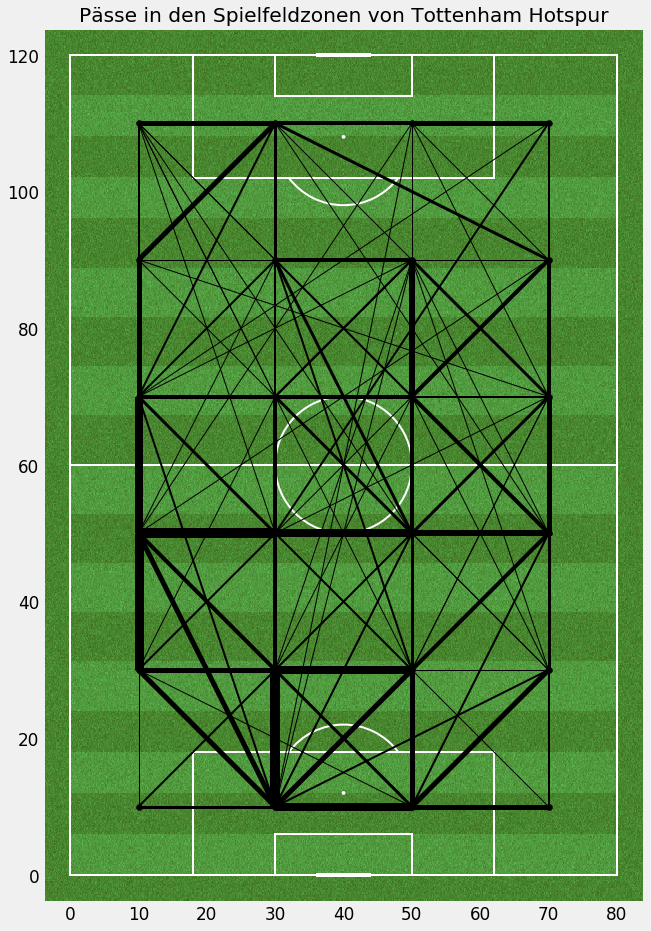

In [53]:
draw_passes_in_zones(team1_id, team1_name)

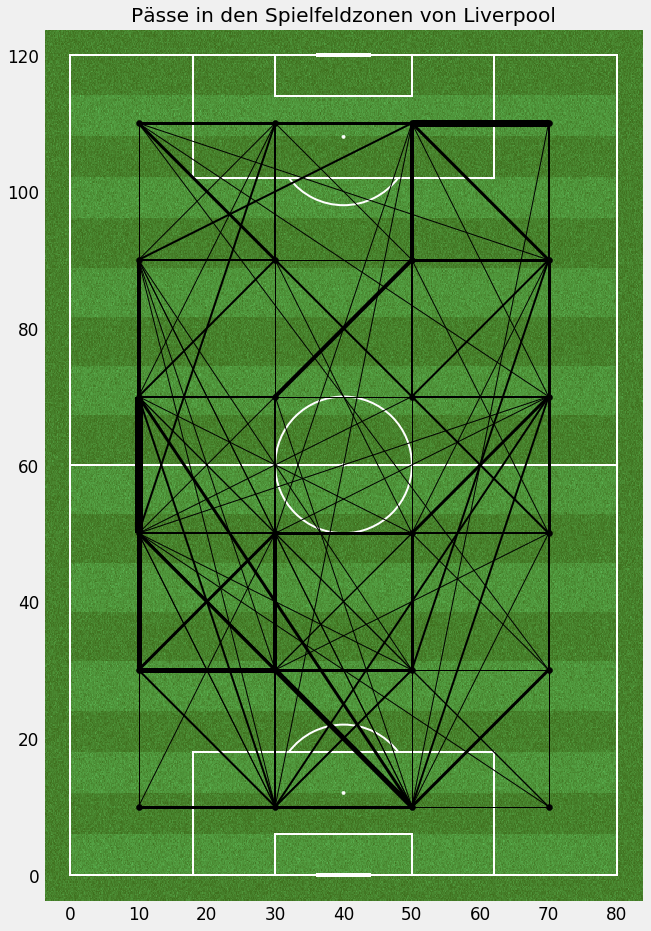

In [54]:
draw_passes_in_zones(team2_id, team2_name)

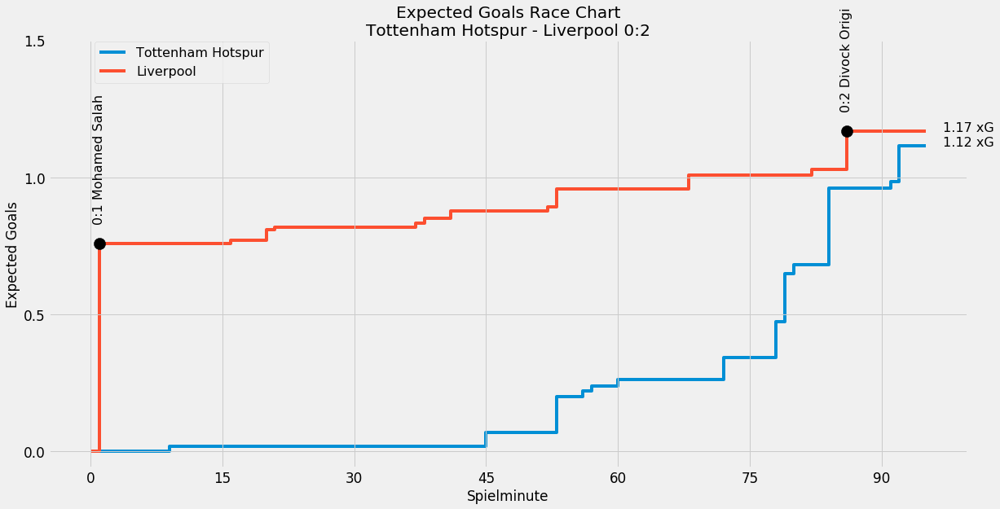

In [55]:
# xG Race-Chart
plt.figure(figsize=(18,9))
# drop penalties from penalty shoutouts
shots = shots[(shots['minute'] < 120) | (shots['penalty'] == 0)]
shots_team1 = shots[shots['team_id'] == team1_id]
shots_team2 = shots[shots['team_id'] == team2_id]
shots_team1.loc[:, 'cum_xg'] = shots_team1['statsbomb_xg'].cumsum()
shots_team2.loc[:, 'cum_xg'] = shots_team2['statsbomb_xg'].cumsum()
plt.step([0] + shots_team1['minute'].tolist() + [events['minute'].max()], 
         [0] + shots_team1['cum_xg'].tolist() + [shots_team1['cum_xg'].max()], where='post', label=team1_name, zorder=0)
plt.step([0] + shots_team2['minute'].tolist() + [events['minute'].max()], 
         [0] + shots_team2['cum_xg'].tolist() + [shots_team2['cum_xg'].max()], where='post', label=team2_name, zorder=0)
plt.text(events['minute'].max() + 2, shots_team1['cum_xg'].max(), str(np.round(shots_team1['cum_xg'].max(), 2)) + ' xG', fontsize=16)
plt.text(events['minute'].max() + 2, shots_team2['cum_xg'].max(), str(np.round(shots_team2['cum_xg'].max(), 2)) + ' xG', fontsize=16)
plt.scatter(shots_team1.loc[shots_team1['goal'] == 1, 'minute'], shots_team1.loc[shots_team1['goal'] == 1, 'cum_xg'], s=200, c='black', label='_nolegend_', zorder=1)
plt.scatter(shots_team2.loc[shots_team2['goal'] == 1, 'minute'], shots_team2.loc[shots_team2['goal'] == 1, 'cum_xg'], s=200, c='black', label='_nolegend_', zorder=1)
for idx, goal in shots_team1[shots_team1['goal'] == 1].iterrows():
    goals_team1 = shots_team1.loc[shots_team1['minute'] <= goal['minute'], 'goal'].sum()
    goals_team2 = shots_team2.loc[shots_team2['minute'] <= goal['minute'], 'goal'].sum()
    plt.text(goal['minute'], goal['cum_xg'] + 0.07, 
             str(goals_team1) + ':' + str(goals_team2) + ' ' + get_player_name(goal['player_id']), 
             rotation='vertical', va='bottom', ha='center', fontsize=16)
for idx, goal in shots_team2[shots_team2['goal'] == 1].iterrows():
    goals_team1 = shots_team1.loc[shots_team1['minute'] <= goal['minute'], 'goal'].sum()
    goals_team2 = shots_team2.loc[shots_team2['minute'] <= goal['minute'], 'goal'].sum()
    plt.text(goal['minute'], goal['cum_xg'] + 0.07, 
             str(goals_team1) + ':' + str(goals_team2) + ' ' + get_player_name(goal['player_id']), 
             rotation='vertical', va='bottom', ha='center', fontsize=16)
plt.xticks(np.arange(0,events['minute'].max(),15))
plt.yticks(np.arange(0,np.max([shots_team1['cum_xg'].max(), shots_team2['cum_xg'].max()])+0.5,0.5))
plt.legend(loc=[0.05,0.9], fontsize=16)
plt.title('Expected Goals Race Chart\n' + team1_name + ' - ' + team2_name + ' ' + str(home_score) + ':' + str(away_score))
plt.xlabel('Spielminute')
plt.ylabel('Expected Goals')
plt.show()